<a href="https://colab.research.google.com/github/amanmehra-23/TSA-Project/blob/main/Forex_hourly_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ta
!pip install statsmodels
!pip install plotly
!pip install pmdarima

In [ ]:
import pandas as pd
import numpy as np
import ta
import plotly.express as px
import statsmodels.tsa.stattools as ts
import statsmodels.graphics.tsaplots as sgt
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm # Import statsmodels with the alias sm

from scipy import stats

In [ ]:
df_hourly =pd.read_csv("/content/EURUSD1hour.csv")
df_hourly['date'] = pd.to_datetime(df_hourly['date'])



In [ ]:
df_hourly.rename(columns={
    'date': 'Date',
    'time': 'Time',
    'open': 'Open',
    'high': 'High',
    'low': 'Low',
    'close': 'Close',
    'volume': 'Volume'
}, inplace=True)

In [ ]:
df_hourly.head()

,Date,Time,Open,High,Low,Close,Volume
0,2010-05-04,00:00,1.31884,1.31981,1.31853,1.31980,750
1,2010-05-04,01:00,1.31982,1.32004,1.31885,1.31942,626
2,2010-05-04,02:00,1.31947,1.32120,1.31915,1.32083,954
3,2010-05-04,03:00,1.32084,1.32131,1.31970,1.32073,896
4,2010-05-04,04:00,1.32076,1.32122,1.31928,1.32013,893


## Date vs Closing Price


In [ ]:
fig = px.line(df_hourly, x='Date', y=['Close'])
fig.show()

##ARIMA MODEL Approach

Upon visual inspection we conclude the data is not stationary

In [ ]:
def adf_test(timeseries):
    """
    Performs an Augmented Dickey-Fuller test and prints the results.

    Args:
        timeseries (pd.Series): The time series data to test.

    Returns:
        None
    """
    print ('Results of Dickey-Fuller Test:')
    dftest = ts.adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

In [ ]:
adf_test(df_hourly['Close'])

Results of Dickey-Fuller Test:
Test Statistic                    -1.714895
p-value                            0.423455
#Lags Used                         0.000000
Number of Observations Used    64920.000000
Critical Value (1%)               -3.430451
Critical Value (5%)               -2.861585
Critical Value (10%)              -2.566794
dtype: float64


Seeing the reulst of the Augemnted Dickey Fuller test we can conclude that the Data is not stationary.

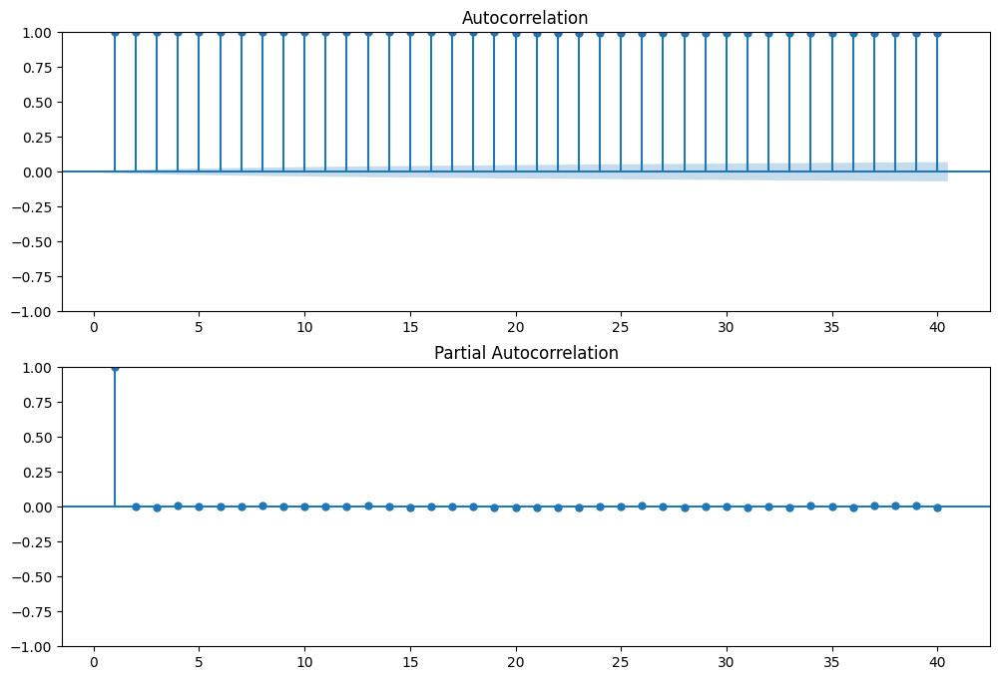

In [ ]:
#ACF
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sgt.plot_acf(df_hourly['Close'], lags = 40, zero = False, ax=ax1)

#PACF
ax2 = fig.add_subplot(212)
fig = sgt.plot_pacf(df_hourly['Close'], lags = 40, zero = False, ax=ax2)
plt.show()

Here we can see that all values of the acf plot are showing significant effect

In [ ]:
# Adding SMA
df_hourly['SMA_20'] = ta.trend.SMAIndicator(df_hourly['Close'], window=20).sma_indicator()

# Adding EMA
df_hourly['EMA_20'] = ta.trend.EMAIndicator(df_hourly['Close'], window=20).ema_indicator()

# Adding RSI
df_hourly['RSI'] = ta.momentum.RSIIndicator(df_hourly['Close'], window=14).rsi()

# Adding MACD
macd = ta.trend.MACD(df_hourly['Close'])
df_hourly['MACD'] = macd.macd()
df_hourly['MACD_signal'] = macd.macd_signal()
df_hourly['MACD_hist'] = macd.macd_diff()






1. Simple Moving Average (SMA)
Explanation: The SMA is calculated by averaging the closing prices over a specific number of periods (in this case, 20). It smooths out price fluctuations to identify the overall trend.
Usage: Traders often use the SMA to identify support and resistance levels. When prices are above the SMA, it may indicate an uptrend, while prices below the SMA can suggest a downtrend.
Exogenous Variable Reason: It helps capture the average price movement over time, providing a trend indicator that can improve the model's understanding of price behavior.
2. Exponential Moving Average (EMA)
Explanation: The EMA is similar to the SMA but gives more weight to the most recent prices. This makes it more responsive to new information and price changes.
Usage: Traders prefer the EMA for its sensitivity to price changes. It can generate buy/sell signals based on crossovers with the price or other moving averages.
Exogenous Variable Reason: The EMA helps detect trends and reversals more quickly than the SMA, offering timely insights into market dynamics that can enhance predictive accuracy.
3. Relative Strength Index (RSI)
Explanation: The RSI is a momentum oscillator that measures the speed and change of price movements on a scale from 0 to 100. It is typically used to identify overbought or oversold conditions in a market (usually above 70 is considered overbought, and below 30 is oversold).
Usage: Traders use the RSI to determine potential reversal points, indicating whether a security is overbought or oversold, and can help identify trend strength.
Exogenous Variable Reason: The RSI adds valuable information about market momentum and potential reversal points, helping the model account for market conditions that may affect price movements.
4. Moving Average Convergence Divergence (MACD)
Explanation: The MACD is a trend-following momentum indicator that shows the relationship between two moving averages of a security's price. It consists of the MACD line, signal line, and histogram, which represent the difference between the two EMAs.
MACD Line: The difference between the 12-day and 26-day EMAs.
Signal Line: The 9-day EMA of the MACD line.
MACD Histogram: The difference between the MACD line and the signal line.
Usage: Traders look for crossovers of the MACD line and the signal line to identify buy/sell signals, as well as divergence between MACD and price to identify potential trend reversals.
Exogenous Variable Reason: The MACD captures trend changes and momentum shifts, making it a useful variable for predicting future price movements by reflecting the market's momentum

In [ ]:
df_hourly.head()

,Date,Time,Open,High,Low,Close,Volume,SMA_20,EMA_20,RSI,MACD,MACD_signal,MACD_hist,ATR
0,2010-05-04,00:00,1.31884,1.31981,1.31853,1.31980,750,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,2010-05-04,01:00,1.31982,1.32004,1.31885,1.31942,626,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,2010-05-04,02:00,1.31947,1.32120,1.31915,1.32083,954,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,2010-05-04,03:00,1.32084,1.32131,1.31970,1.32073,896,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,2010-05-04,04:00,1.32076,1.32122,1.31928,1.32013,893,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [ ]:
df_hourly.dropna(inplace=True)

In [ ]:
df_hourly.tail()

,Date,Time,Open,High,Low,Close,Volume,SMA_20,EMA_20,RSI,MACD,MACD_signal,MACD_hist,ATR
64916,2020-10-20,19:00,1.18231,1.18317,1.18193,1.18263,1677,1.179010,1.179611,70.789037,0.001805,0.001493,0.000312,0.001372
64917,2020-10-20,20:00,1.18263,1.18359,1.18263,1.18316,1128,1.179336,1.179949,72.387976,0.001865,0.001567,0.000297,0.001342
64918,2020-10-20,21:00,1.18315,1.18345,1.18260,1.18270,982,1.179631,1.180211,68.864680,0.001854,0.001625,0.000229,0.001307
64919,2020-10-20,22:00,1.18270,1.18297,1.18219,1.18242,1616,1.179912,1.180421,66.735442,0.001802,0.001660,0.000142,0.001270
64920,2020-10-20,23:00,1.18241,1.18268,1.18192,1.18211,842,1.180143,1.180582,64.362702,0.001716,0.001671,0.000044,0.001233


In [ ]:
exog_columns = ['SMA_20', 'EMA_20', 'RSI', 'MACD']

# Define your endogenous variable (e.g., the target variable - Close prices)
y = df_hourly['Close']

# Define exogenous variables (technical indicators)
X = df_hourly[exog_columns]

In [ ]:
# Split the dataset (95% train, 5% test)
train_size = int(len(df_hourly) * 0.95)
y_train, y_test = y[:train_size], y[train_size:]
X_train, X_test = X[:train_size], X[train_size:]

In [ ]:
# Use pmdarima's auto_arima to find the best (p,d,q) for ARIMAX model
# Allow auto_arima to handle differencing if needed (d parameter)
arimax_model = auto_arima(y_train, exogenous=X_train, start_p=1, start_q=1,
                          max_p=5, max_q=5, m=1, seasonal=False,
                          d=None,  # Allow it to automatically determine differencing
                          trace=True, error_action='ignore',
                          suppress_warnings=True, stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-634205.292, Time=29.84 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-634209.292, Time=6.13 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-634207.372, Time=11.94 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-634207.371, Time=16.14 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-634210.974, Time=5.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 69.250 seconds


In [ ]:
print(arimax_model.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                61643
Model:               SARIMAX(0, 1, 0)   Log Likelihood              317106.487
Date:                Tue, 05 Nov 2024   AIC                        -634210.974
Time:                        18:16:18   BIC                        -634201.944
Sample:                             0   HQIC                       -634208.172
                              - 61643                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.992e-06   4.09e-09    487.237      0.000    1.98e-06       2e-06
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):            461456.32
Prob(Q):                              0.78   Pr

In [ ]:
arimax_model.fit(y_train, exogenous=X_train)

ARIMA(order=(0, 1, 0), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [ ]:
# Make predictions on the test set
y_pred = arimax_model.predict(n_periods=len(y_test), exogenous=X_test)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



In [ ]:
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.003552021234822813


In [ ]:
df_combined = pd.DataFrame({
    'Date': df_hourly['Date'],
    'Train': y_train,
    'Test': y_test,
    'Predicted': y_pred
})

# Plot using Plotly Express
fig = px.line(df_combined, x='Date', y=['Train', 'Test', 'Predicted'],
              labels={'Train': 'Training Data', 'Test': 'Testing Data', 'Predicted': 'Predicted Data'},
              title='Train, Test and Predicted Closing Prices')

# Show the plot
fig.show()

#LSTM Approach

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error, mean_absolute_error
import plotly.graph_objs as go

In [ ]:
df_hourly_dates =df_hourly.copy()
df_hourly = df_hourly.drop(['Date', 'Time'], axis=1)

In [ ]:
# Scale the features using MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_hourly)

In [ ]:
X = scaled_data[:, df_hourly.columns != 'Close']  # All columns except 'Close' (features)
y = scaled_data[:, df_hourly.columns.get_loc('Close')]  # 'Close' price column as target

In [ ]:
def create_sequences(X, y, time_steps=5):  # 5-year look-back period
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:i+time_steps])
        ys.append(y[i+time_steps])
    return np.array(Xs), np.array(ys)

In [ ]:
time_steps = 24
X_seq, y_seq = create_sequences(X, y, time_steps)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, shuffle=False)

In [ ]:
# Initialize the model
model = Sequential()

# First LSTM layer with increased units and dropout
model.add(LSTM(units=100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))

# Second LSTM layer with increased units
model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.2))

# Additional LSTM layer
model.add(LSTM(units=100, return_sequences=False))  # Last LSTM layer without return sequences
model.add(Dropout(0.2))

# Output layer (regression, so no activation function)
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 24, 100)             │          44,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 24, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 24, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 24, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 100)                 │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 205,701 (803.52 KB)

 Trainable params: 205,701 (803.52 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 19s 10ms/step - loss: 0.0051 - val_loss: 1.0184e-04
Epoch 2/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - loss: 7.6115e-04 - val_loss: 1.7490e-05
Epoch 3/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 23s 11ms/step - loss: 5.1984e-04 - val_loss: 3.6851e-05
Epoch 4/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 18s 9ms/step - loss: 3.9550e-04 - val_loss: 1.3961e-05
Epoch 5/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 3.5061e-04 - val_loss: 5.9579e-05
Epoch 6/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 3.1279e-04 - val_loss: 1.2638e-05
Epoch 7/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 3.0811e-04 - val_loss: 8.5219e-05
Epoch 8/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - loss: 2.9268e-04 - val_loss: 1.2483e-04
Epoch 9/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - loss: 2.9451e-04 - val_loss: 7.9787e-06
Epoch 10/20
1622/1622 ━━━━━━━━━━━━━━━━━━━━ 22s 10ms/step - loss: 2.6687e-04 - val_loss: 9.3933e-06
Epoch 11/20
1622/1622 ━━━━━━

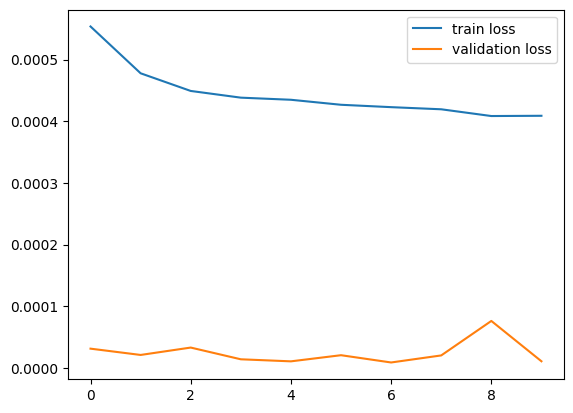

In [ ]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

In [ ]:
predicted_price = model.predict(X_test)

406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
# Extract the 'Close' column for scaling separately
close_scaler = MinMaxScaler()

# Fit the scaler on the 'Close' price column only
close_scaled = close_scaler.fit_transform(df_hourly[['Close']])


In [ ]:
actual_price_rescaled_train = close_scaler.inverse_transform(y_train.reshape(-1, 1))

# Make predictions (assuming 'predicted_price' is already computed by the model)
predicted_price_rescaled = close_scaler.inverse_transform(predicted_price)

# Rescale the actual closing prices
actual_price_rescaled_test = close_scaler.inverse_transform(y_test.reshape(-1, 1))

In [ ]:
mse = mean_squared_error(actual_price_rescaled_test, predicted_price_rescaled)
mae = mean_absolute_error(actual_price_rescaled_test, predicted_price_rescaled)

print(f'MSE: {mse}')
print(f'MAE: {mae}')


MSE: 5.9820598041466665e-06
MAE: 0.002156008847809366


In [ ]:
date_data=df_hourly_dates["Date"]
train_df = pd.DataFrame({
    'Date': date_data[:len(y_train)],
    'Close_Train': actual_price_rescaled_train.flatten()
})

test_df = pd.DataFrame({
    'Date': date_data[len(y_train):len(y_train) + len(y_test)],
    'Close_Test': actual_price_rescaled_test.flatten(),
    'Predicted_Close': predicted_price_rescaled.flatten()
})

# Create Plotly traces
trace_train = go.Scatter(x=train_df['Date'], y=train_df['Close_Train'], mode='lines', name='Y_train')
trace_test = go.Scatter(x=test_df['Date'], y=test_df['Close_Test'], mode='lines', name='Y_test', line=dict(color='blue'))
trace_pred = go.Scatter(x=test_df['Date'], y=test_df['Predicted_Close'], mode='lines', name='Y_pred', line=dict(color='red', dash='dash'))

# Layout configuration
layout = go.Layout(
    title="Y_train, Y_test, and Y_pred vs Date",
    xaxis=dict(title='Date'),
    yaxis=dict(title='Close Price'),
    hovermode='x unified'
)

# Create the figure
fig = go.Figure(data=[trace_train, trace_test, trace_pred], layout=layout)

# Show the interactive plot
fig.show()

#MonteCarlo Approach

In [ ]:
#df_hourly =pd.read_csv("/content/EURUSD1hour.csv")

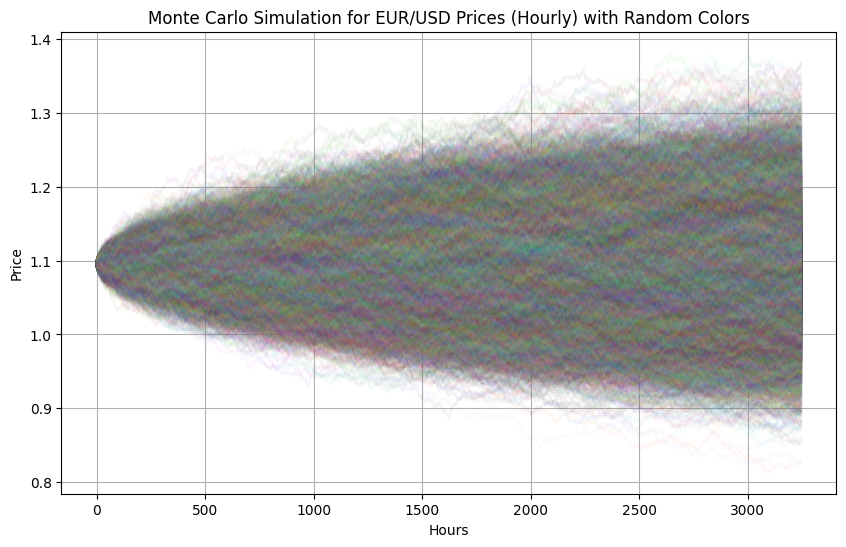

Mean Squared Error: 0.00427369914014748


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# 1. Split the dataset into training (95%) and test (last 5%)
split_index = int(0.95 * len(df_hourly))  # 95% for training

# Training data (first 95%)
training_data = df_hourly.iloc[:split_index]
closing_prices_train = training_data['close'].values

# Test data (last 5%)
test_data = df_hourly.iloc[split_index:]
real_future_prices = test_data['close'].values  # Use real future prices for evaluation

# Calculate hourly returns using the training data
hourly_returns = closing_prices_train[1:] / closing_prices_train[:-1] - 1

# Calculate drift and volatility
mean_return = np.mean(hourly_returns)
volatility = np.std(hourly_returns)

# 2. Monte Carlo simulation using Geometric Brownian Motion (GBM) to predict future prices
n_simulations = 20000  # Number of simulations
n_future_hours = len(real_future_prices)  # Predicting for the length of test data (last 5%)
last_price = closing_prices_train[-1]  # Last price from the training data

simulated_prices = np.zeros((n_simulations, n_future_hours))

for i in range(n_simulations):
    # Generate random shocks using the mean return (drift) and volatility
    random_shocks = np.random.normal(mean_return, volatility, n_future_hours)
    simulated_prices[i] = last_price * np.cumprod(1 + random_shocks)

# 3. Plot the simulation results using matplotlib with random colors
plt.figure(figsize=(10, 6))

# Plot each simulation (assign random colors and use low alpha for transparency)
for i in range(n_simulations):
    color = np.random.rand(3,)  # Generate a random color
    plt.plot(simulated_prices[i], color=color, alpha=0.05)

plt.title('Monte Carlo Simulation for EUR/USD Prices (Hourly) with Random Colors')
plt.xlabel('Hours')
plt.ylabel('Price')
plt.grid(True)
plt.show()

# 4. Calculate mean predicted price
mean_simulated_prices = np.mean(simulated_prices, axis=0)

# 5. Calculate MSE using the real test data (last 5%)
mse = mean_squared_error(real_future_prices, mean_simulated_prices)
print(f"Mean Squared Error: {mse}")






# Prophet Model Approach

In [ ]:
!pip install prophet

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_squared_error
import numpy as np

In [ ]:
# Convert date and time to a single datetime column
df_hourly['datetime'] = pd.to_datetime(df_hourly['date'] + ' ' + df_hourly['time'])
df = df_hourly[['datetime', 'close']]  # Keep only the datetime and close columns
df.rename(columns={'datetime': 'ds', 'close': 'y'}, inplace=True)

<ipython-input-77-49f8f1d3b9f3>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Split the data into training and testing sets
train_size = int(len(df) * 0.95)
train = df[:train_size]
test = df[train_size:]


In [ ]:
# Initialize and fit the Prophet model with additional settings
model = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    changepoint_prior_scale=0.05,
    seasonality_prior_scale=10.0
)
model.add_country_holidays('US')  # Adjust as needed
model.fit(train)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpldfiu3ii/c1km9x5f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpldfiu3ii/5um1auj8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72711', 'data', 'file=/tmp/tmpldfiu3ii/c1km9x5f.json', 'init=/tmp/tmpldfiu3ii/5um1auj8.json', 'output', 'file=/tmp/tmpldfiu3ii/prophet_model0xc5_zfu/prophet_model-20241105190148.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:01:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:04:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
# Make future DataFrame and predict
future = model.make_future_dataframe(periods=len(test))
forecast = model.predict(future)

# Get the predicted values for the test set
predicted_values = forecast['yhat'][-len(test):].values

In [ ]:
# Evaluate the performance of the model using Mean Squared Error
mse = mean_squared_error(test['y'], predicted_values)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.1219257343999693


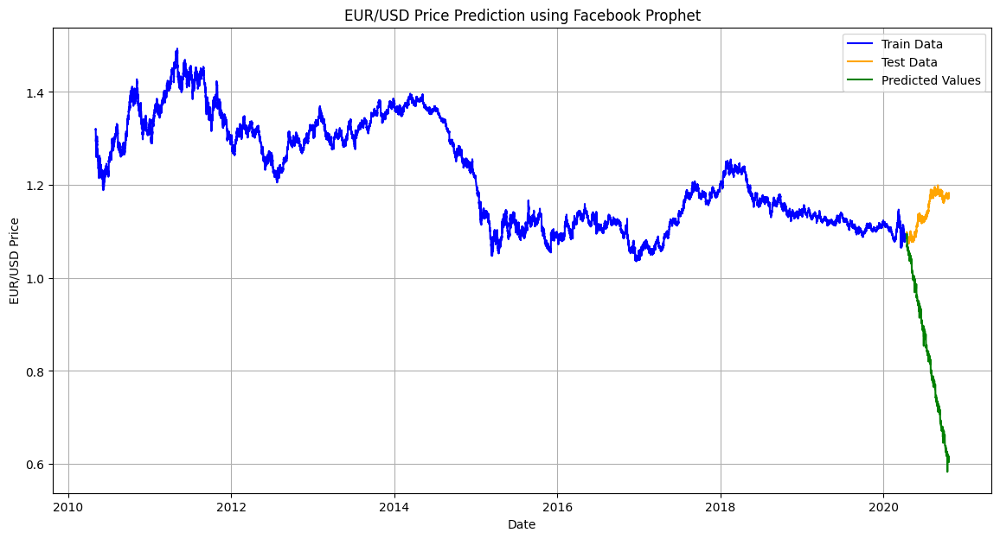

In [ ]:
# Plotting actual vs predicted values
plt.figure(figsize=(14, 7))
plt.plot(train['ds'], train['y'], label='Train Data', color='blue')
plt.plot(test['ds'], test['y'], label='Test Data', color='orange')
plt.plot(test['ds'], predicted_values, label='Predicted Values', color='green')
plt.title('EUR/USD Price Prediction using Facebook Prophet')
plt.xlabel('Date')
plt.ylabel('EUR/USD Price')
plt.legend()
plt.grid()
plt.show()

# Conclusion

#Conclusion
In this project, we aimed to predict the forex prices of the EUR/USD currency pair using four distinct modeling approaches:

ARIMAX with exogenous variables, an LSTM neural network, a Monte Carlo simulation, and the Facebook Prophet model. Each model was evaluated based on its performance, measured by the Mean Squared Error (MSE), which reflects the accuracy of the predictions made against actual market prices.

###ARIMAX Model:
By incorporating technical indicators such as the Simple Moving Average (SMA), Exponential Moving Average (EMA), Relative Strength Index (RSI), and the Moving Average Convergence Divergence (MACD) as exogenous variables, the ARIMAX model
 an impressive MSE of 0.0035. This model demonstrated a robust capacity to capture the time series dynamics and the influence of the chosen technical indicators on price movements.
###LSTM Model:
The Long Short-Term Memory (LSTM) model, structured with three layers of LSTM units and dropout for regularization, yielded an MSE of 5.98 after 20 epochs. While LSTM models are generally effective for sequential data, this relatively higher MSE indicates that further optimization in terms of hyperparameter tuning, data preprocessing, or additional training epochs may be needed to enhance its predictive capability.
###Monte Carlo Approach:
Utilizing a Monte Carlo simulation for price prediction provided an MSE of 0.00427. This stochastic method, which relies on repeated random sampling, allows for a robust exploration of potential price paths, demonstrating a reasonable performance in predicting price movements in the forex market.
###Facebook Prophet Model:
The Prophet model, designed for forecasting time series data with strong seasonal effects, produced the highest MSE of 0.122. Although Prophet is user-friendly and requires minimal tuning, its performance in this context suggests it may not fully capture the complexities of forex price dynamics as effectively as the other models tested.
Summary

###In conclusion,
the ARIMAX model with technical indicators emerged as the most effective forecasting tool for EUR/USD prices in this study, achieving the lowest MSE. The results underscore the importance of incorporating relevant exogenous variables to enhance predictive accuracy. Conversely, the LSTM model and the Monte Carlo approach displayed competitive performances, albeit with room for improvement. The Facebook Prophet model, while useful for capturing seasonal trends, highlighted the challenges inherent in forex price prediction due to market volatility and external influences.

###Future work
could involve refining the LSTM model through additional hyperparameter optimization, exploring other neural network architectures, and considering more extensive datasets to further enhance the robustness of the predictions. Additionally, combining predictions from multiple models through ensemble methods may provide a more comprehensive approach to forex price forecasting.

